In [39]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
sns.set_style('darkgrid')
datos_url= "C://Users/maxib/Source/repos/proyecto_final_coder/datos/Base_predictive_maintenance.csv"

In [40]:
# Leer .csv y creo un DF
df = pd.read_csv(datos_url, delimiter=",", index_col= ["UDI", "Product_ID"])
df.head()

,,Type,Air_temperature_[K],Process_temperature_[K],Rotational_speed_[rpm],Torque_[Nm],Tool_wear_[min],Target,Failure_Type
UDI,Product_ID,,,,,,,,
1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure


Usamos definiciones matematicas para explicar relaciones mas complejas entre las features:
- Potencia[W] = T[Nm]*Vang[rad/s]
- Sobre esfuerzo = Uso[min]*T[Nm]
- Despeje de Temp = |Temp_ambiente-Temp_Trabajo|*rpm


In [41]:
# Creamos nuevos Features,

df['Power_[W]'] = df['Torque_[Nm]']*(2*np.pi*df['Rotational_speed_[rpm]']/60.0)

df['Overstrain_[minNm]'] = df['Torque_[Nm]'] * df['Tool_wear_[min]']

df['Heat dissipation_[rpminK]'] = abs(df['Air_temperature_[K]'] -df['Process_temperature_[K]'])*df['Rotational_speed_[rpm]']

# General

In [42]:
# Datos del Frame
df.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 10000 entries, (1, 'M14860') to (10000, 'M24859')
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Type                       10000 non-null  object 
 1   Air_temperature_[K]        10000 non-null  float64
 2   Process_temperature_[K]    10000 non-null  float64
 3   Rotational_speed_[rpm]     10000 non-null  int64  
 4   Torque_[Nm]                10000 non-null  float64
 5   Tool_wear_[min]            10000 non-null  int64  
 6   Target                     10000 non-null  int64  
 7   Failure_Type               10000 non-null  object 
 8   Power_[W]                  10000 non-null  float64
 9   Overstrain_[minNm]         10000 non-null  float64
 10  Heat dissipation_[rpminK]  10000 non-null  float64
dtypes: float64(6), int64(3), object(2)
memory usage: 1.7+ MB


In [43]:
# Filtramos variables para centrarnos en los momentos de falla 
fallas= df[df['Failure_Type']!="No Failure"]
# Filtramos momentos sin fallas
sin_fallas= df[df['Failure_Type']=="No Failure"]

In [44]:
df.groupby(['Target','Failure_Type']).median()

Air_temperature_[K]  Process_temperature_[K]  \
Target Failure_Type                                                             
0      No Failure                             300.00                    310.0   
       Random Failures                        300.75                    311.1   
1      Heat Dissipation Failure               302.45                    310.7   
       No Failure                             300.50                    309.9   
       Overstrain Failure                     299.45                    310.1   
       Power Failure                          300.40                    310.2   
       Tool Wear Failure                      300.40                    310.3   

                                 Rotational_speed_[rpm]  Torque_[Nm]  \
Target Failure_Type                                                    
0      No Failure                                1507.0        39.80   
       Random Failures                           1490.0        44.60   
1      Heat Dissipation Failure                  1346.0        52.35   
       No Failure                                1438.0        45.20   
       Overstrain Failure                        1362.5        56.75   
       Power Failure                             1386.0        63.60   
       Tool Wear Failure                         1521.0        37.70   

                                 Tool_wear_[min]    Power_[W]  \
Target Failure_Type                                             
0      No Failure                          107.0  6243.035753   
       Random Failures                     142.0  6915.074782   
1      Heat Dissipation Failure            106.0  7298.925044   
       No Failure                          119.0  6811.266088   
       Overstrain Failure                  207.0  8088.454402   
       Power Failure                       100.0  9100.377103   
       Tool Wear Failure                   215.0  5986.933120   

                                 Overstrain_[minNm]  Heat dissipation_[rpminK]  
Target Failure_Type                                                             
0      No Failure                           3951.20                   15196.80  
       Random Failures                      5645.40                   14837.85  
1      Heat Dissipation Failure             5549.65                   11050.85  
       No Failure                           4449.90                   15465.90  
       Overstrain Failure                  11545.40                   13862.65  
       Power Failure                        3608.80                   14188.20  
       Tool Wear Failure                    7843.20                   14706.00

In [45]:
df.groupby(['Type','Target']).median()

Air_temperature_[K]  Process_temperature_[K]  \
Type Target                                                 
H    0                     299.7                    309.9   
     1                     302.0                    310.2   
L    0                     300.1                    310.1   
     1                     301.2                    310.4   
M    0                     300.1                    310.0   
     1                     302.0                    310.6   

             Rotational_speed_[rpm]  Torque_[Nm]  Tool_wear_[min]  \
Type Target                                                         
H    0                         1502         40.2              106   
     1                         1371         53.8              147   
L    0                         1508         39.7              107   
     1                         1362         53.9              182   
M    0                         1506         40.0              105   
     1                         1372         51.6              125   

               Power_[W]  Overstrain_[minNm]  Heat dissipation_[rpminK]  
Type Target                                                              
H    0       6237.752641              3988.6                    15304.1  
     1       7350.949818              7374.8                    12313.2  
L    0       6233.024544              3974.4                    15216.0  
     1       7733.302588              8345.6                    12926.0  
M    0       6269.278524              3887.2                    15140.4  
     1       7307.606312              6489.0                    12759.6

<Figure size 720x480 with 0 Axes>

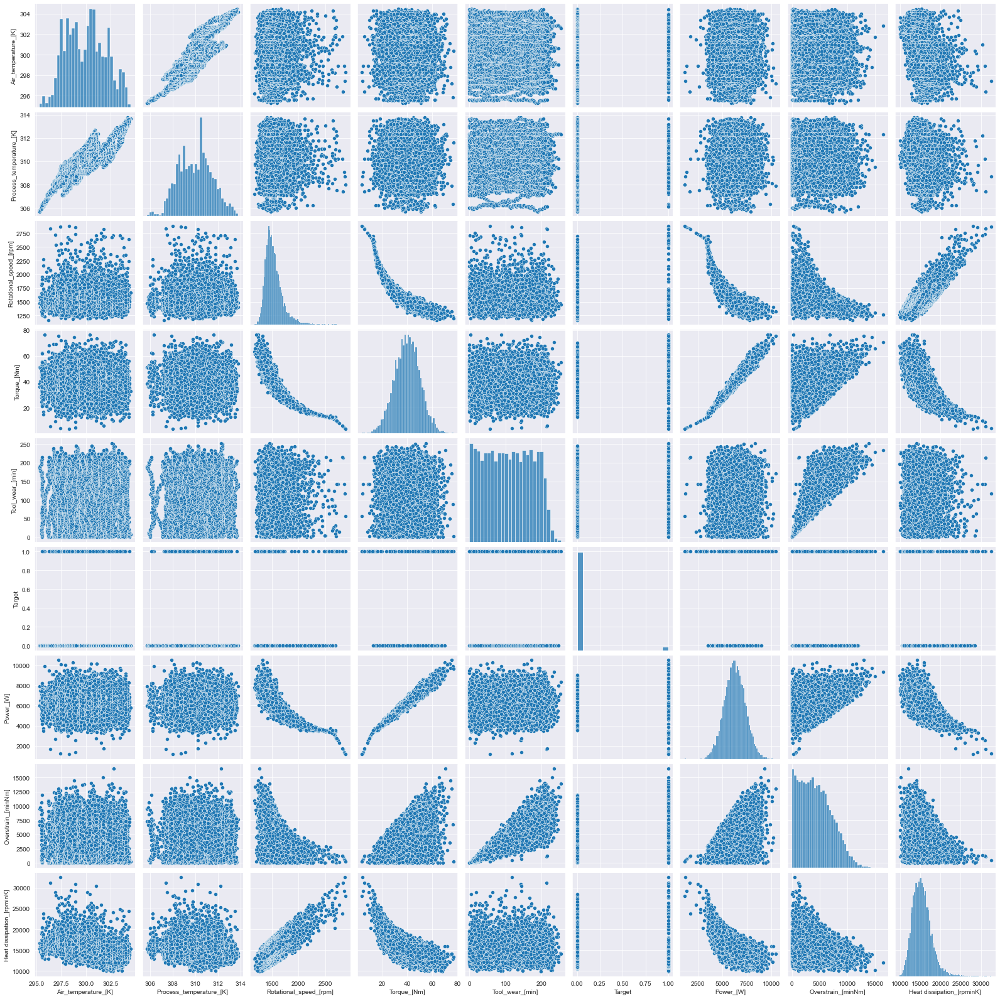

In [46]:
# Pairplot data set
plt.figure(dpi=120)
sns.pairplot(df.drop("Target"))
plt.show()

# Segmentación según Target

<Figure size 720x480 with 0 Axes>

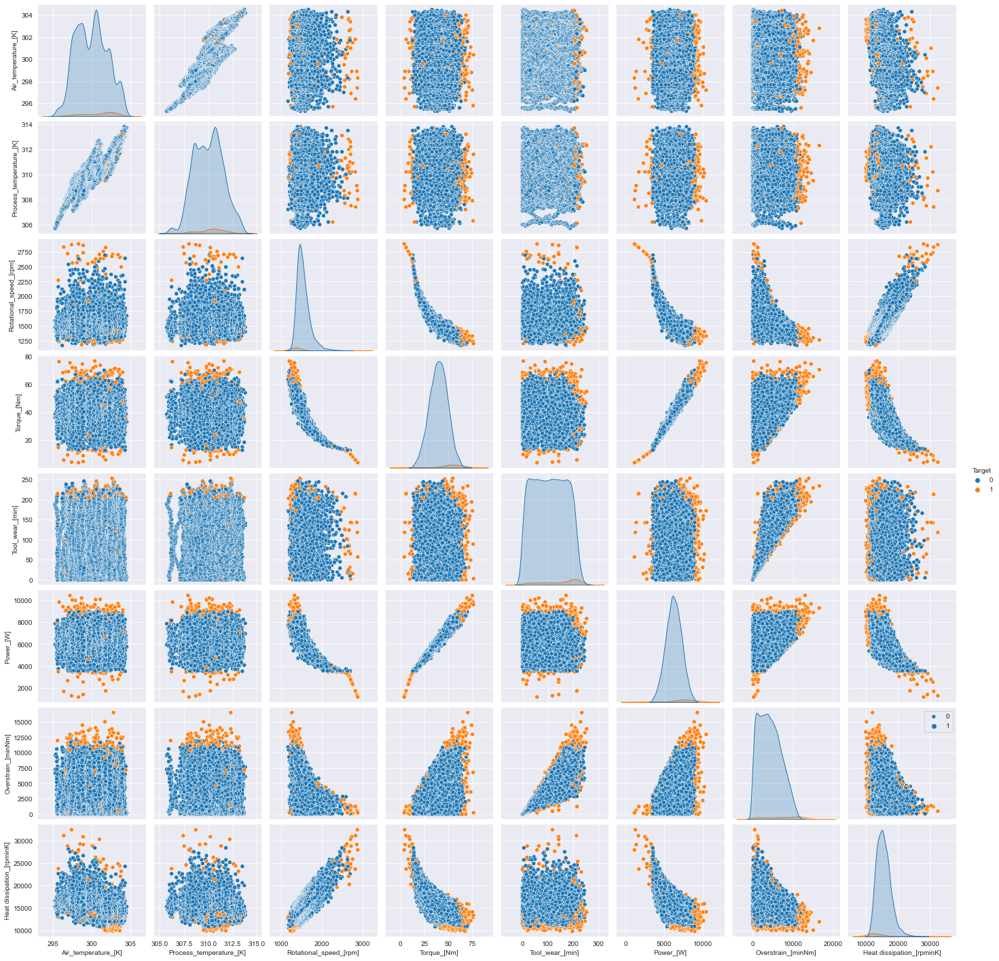

In [47]:
# Crear el Pairplot pero ahora con el atributo hue= TARGET
legenda= df["Target"].unique()
plt.figure(dpi=120)
sns.pairplot(df, hue="Target")
plt.legend(legenda)
plt.show()

Insight: Podemos notar que los valores de falla se encuentran representados en los valores ubicados en los extremos.

# Segmentación según Failure_Type

<Figure size 720x480 with 0 Axes>

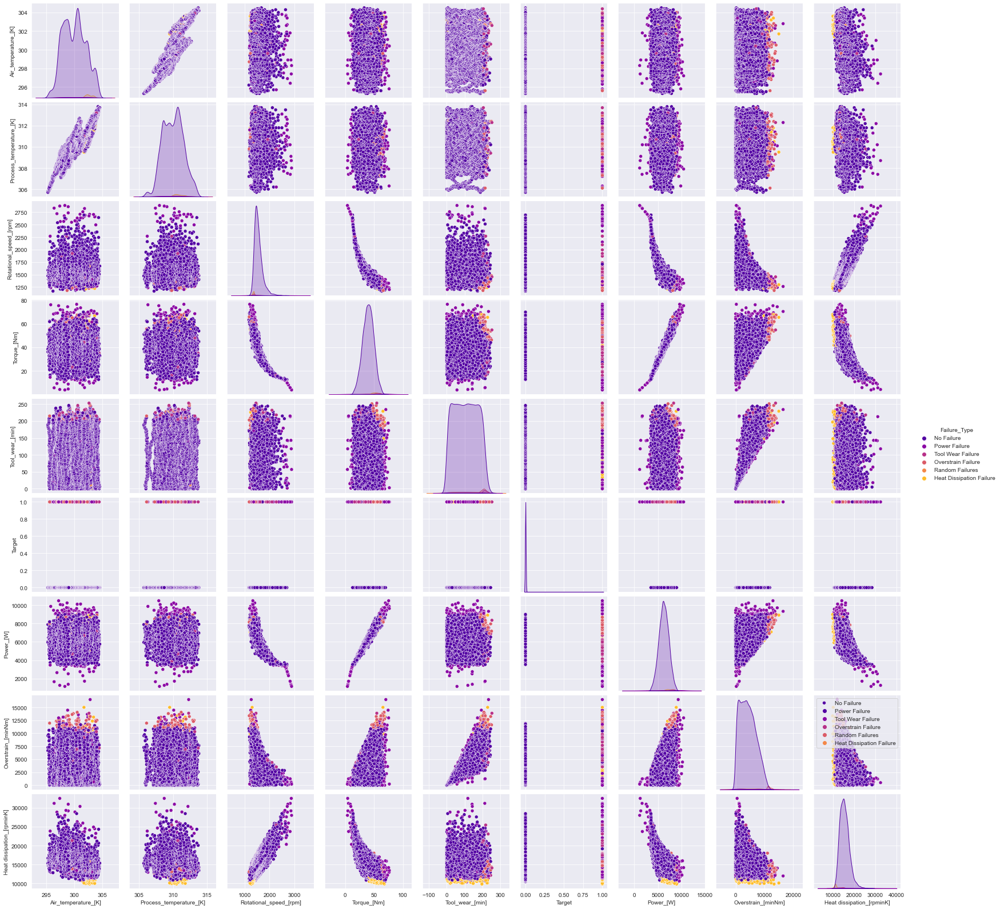

In [48]:
#Crear el Pairplot pero ahora con el atributo hue= failure_type(tiene un gran desbalance)
legenda= df["Failure_Type"].unique()
plt.figure(dpi=120)
sns.pairplot(df, hue="Failure_Type", palette= "plasma")
plt.legend(legenda)
plt.show()

## Segmentación según Failure_Type, Momentos de No Falla

<Figure size 720x480 with 0 Axes>

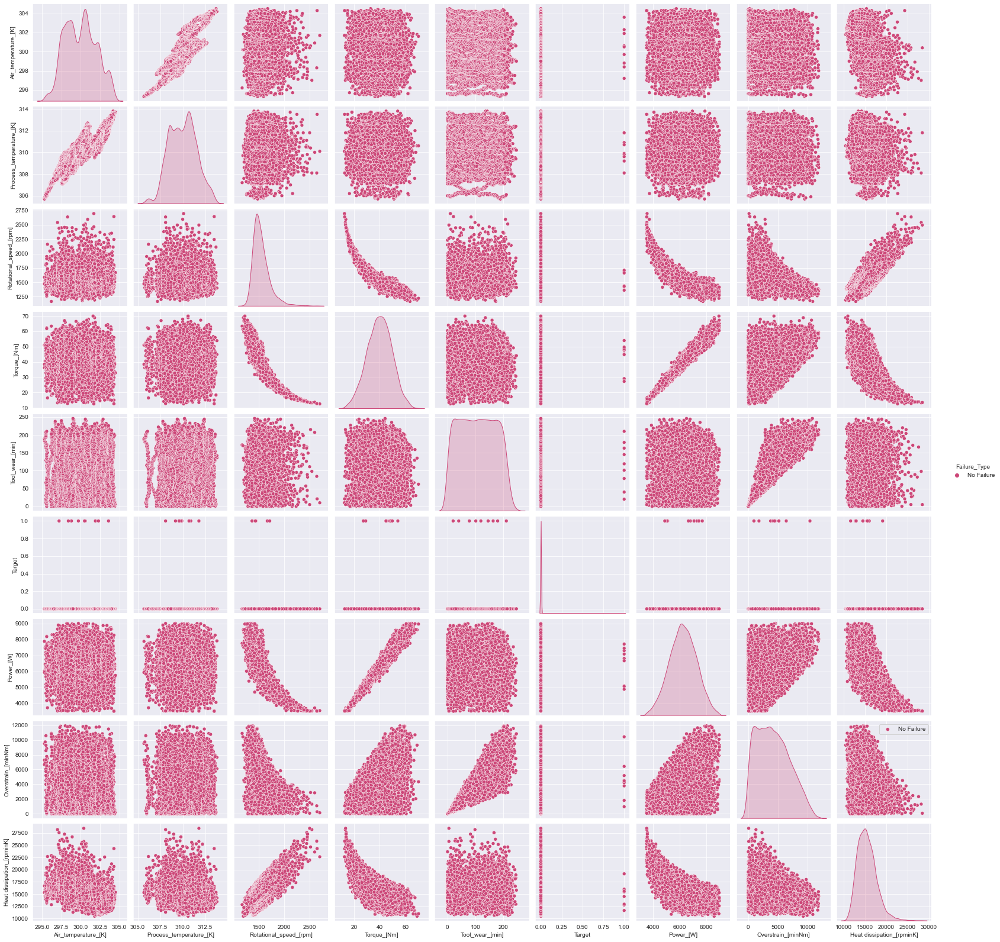

In [49]:
# Crear el Pairplot pero ahora con el atributo hue= failure_type(elimino momentos de falla para ver valores normales).
legenda= sin_fallas["Failure_Type"].unique()
plt.figure(dpi=120)
sns.pairplot(sin_fallas, hue="Failure_Type", palette= "plasma")
plt.legend(legenda)
plt.show()

## Segmentación según Failure_Type, Momentos de Falla

<Figure size 720x480 with 0 Axes>

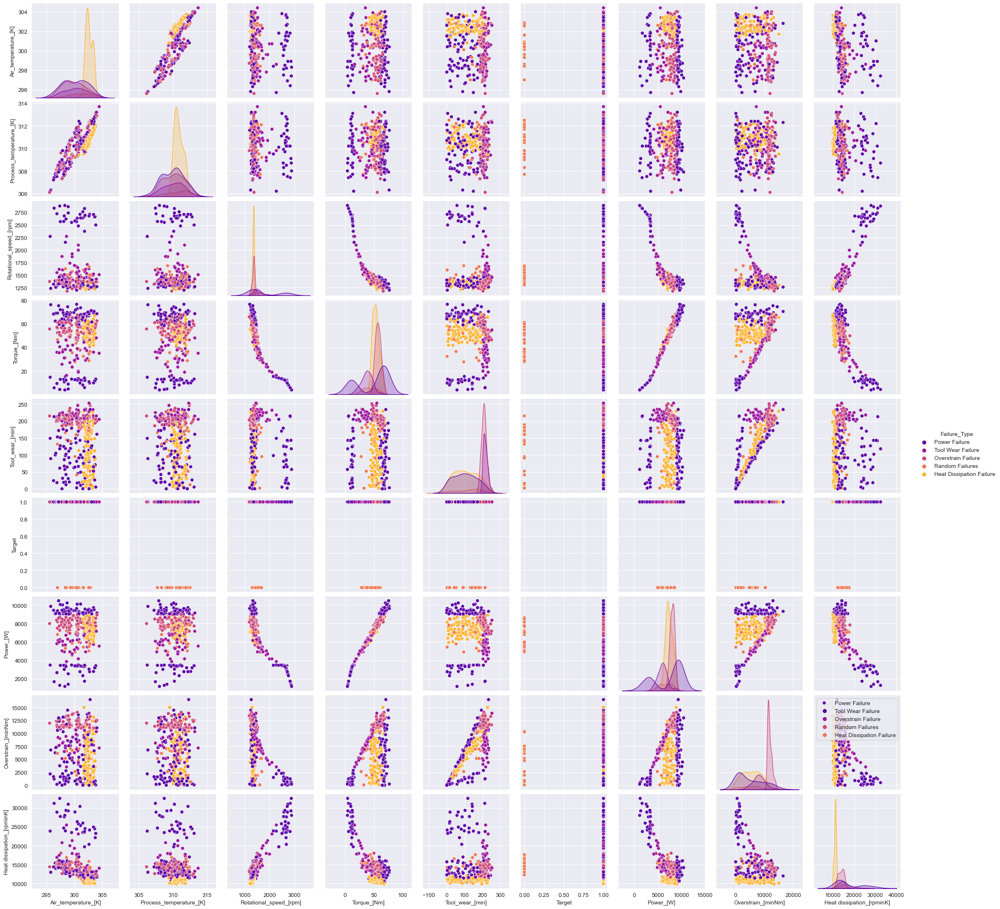

In [50]:
# Crear el Pairplot pero ahora con el atributo hue= failure_type(elimino momentos de no_failure).
legenda= fallas["Failure_Type"].unique()
plt.figure(dpi=120)
sns.pairplot(fallas, hue="Failure_Type", palette= "plasma")
plt.legend(legenda)
plt.show()

# Correlación

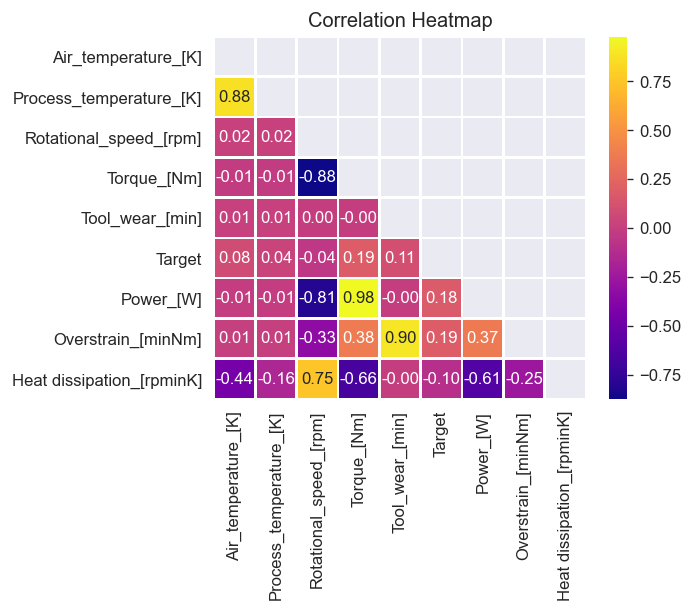

In [51]:
#Correlaciones
plt.figure(dpi = 120,figsize= (5,4))
mascara = np.triu(np.ones_like(df.corr(),dtype = bool))
sns.heatmap(df.corr(),mask = mascara, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

Insight: Existen 2 pares de variables con una correlacion lineal marcada, una de forma positiva y otra negativa, el primer par es el de las variables que representan las temperaturas, es logico que cuando la temperatura del proceso de produccion aumente, la temperatura del air aumente. 
Mientras que el otro par es la variable Torque y la variable Rotational_speed, esta relacion negativa se debe a la dificultad de mantener altos valores de torque a velocidades altas de rotación.

Joint plot de Rotational_speed_[rpm] con otras variables ==> 

Correlacion entre Rotational_speed_[rpm] y Air_temperature_[K] ==>  0.022670458795547032


<Figure size 500x400 with 0 Axes>

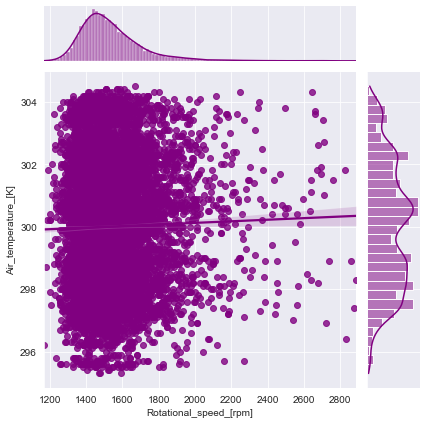

Correlacion entre Rotational_speed_[rpm] y Process_temperature_[K] ==>  0.019276713901805416


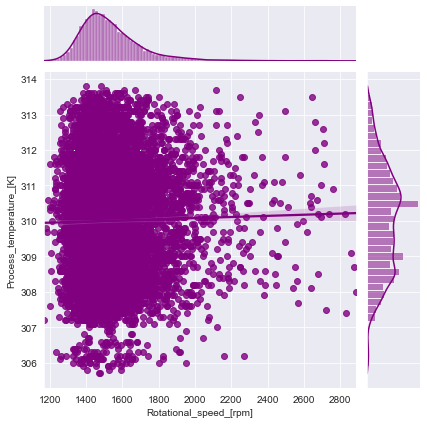

Correlacion entre Rotational_speed_[rpm] y Torque_[Nm] ==>  -0.8750270862996068


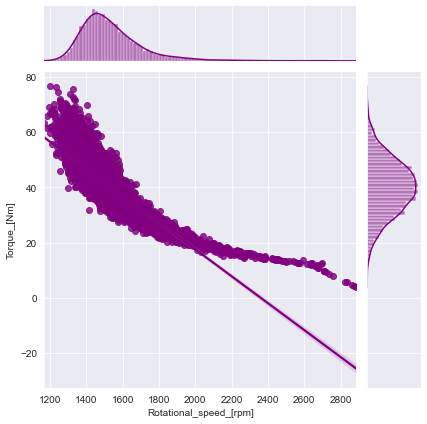

Correlacion entre Rotational_speed_[rpm] y Tool_wear_[min] ==>  0.00022308484018731056


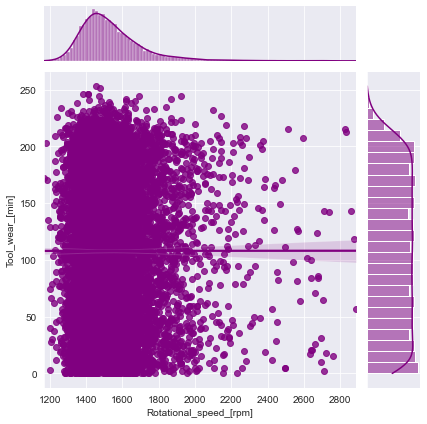

Correlacion entre Rotational_speed_[rpm] y Target ==>  -0.04418755973437811


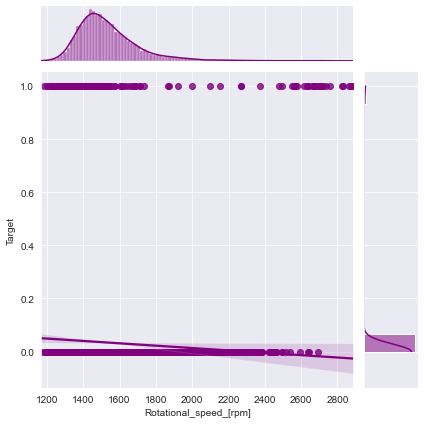

Correlacion entre Rotational_speed_[rpm] y Power_[W] ==>  -0.8055837074013551


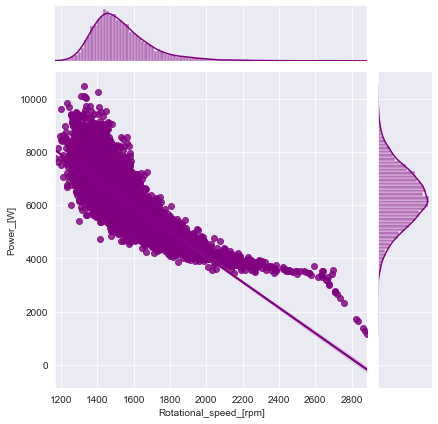

Correlacion entre Rotational_speed_[rpm] y Overstrain_[minNm] ==>  -0.3312774549518598


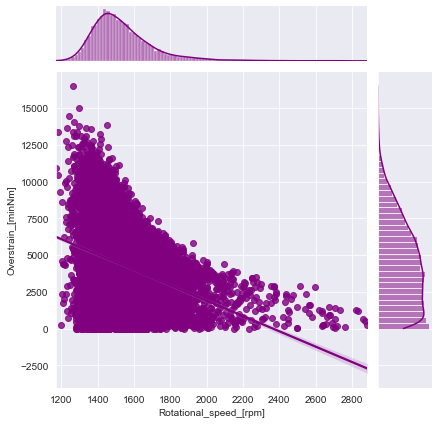

Correlacion entre Rotational_speed_[rpm] y Heat dissipation_[rpminK] ==>  0.748861106714114


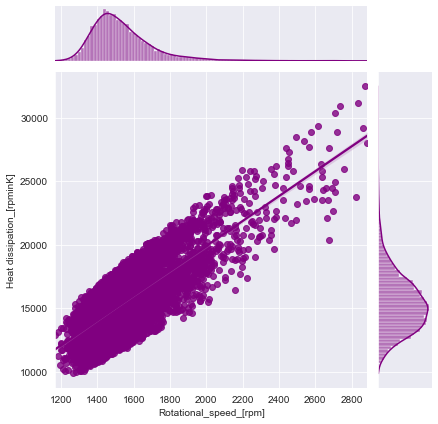

In [52]:
#JoinPlot
plt.figure(dpi = 100, figsize = (5,4))
print("Joint plot de Rotational_speed_[rpm] con otras variables ==> \n")
for columna in  df.columns:
    if columna != "Rotational_speed_[rpm]" and columna != "Type" and columna != "Failure_Type":
        print(f"Correlacion entre Rotational_speed_[rpm] y {columna} ==> ",df.corr().loc["Rotational_speed_[rpm]"][columna])
        sns.jointplot(x="Rotational_speed_[rpm]",y=columna,data=df,kind = 'reg',color = 'purple')
        plt.show()

Insight: Se puede observar una relacion lineal negativa importante entre la variable Torque_[Nm] y la variable Rotational_speed_[rpm], mientras que existe una pequeña relacion lineal positiva entre Process_temperature_[K] y Rotational_speed_[rpm], lo mismo entre Air_temperature_[K] y Rotational_speed_[rpm].

Joint plot de Air_temperature_[K] con otras variables ==> 

Correlacion entre Air_temperature_[K] y Process_temperature_[K] ==>  0.8761071581166469


<Figure size 500x400 with 0 Axes>

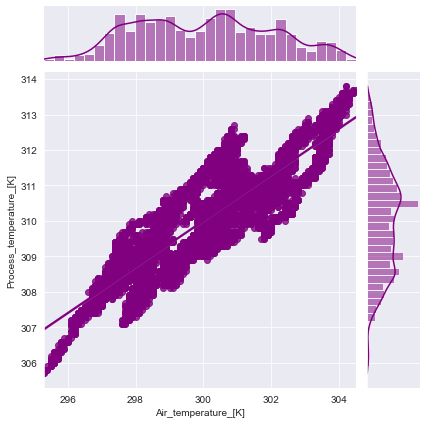

Correlacion entre Air_temperature_[K] y Rotational_speed_[rpm] ==>  0.022670458795547032


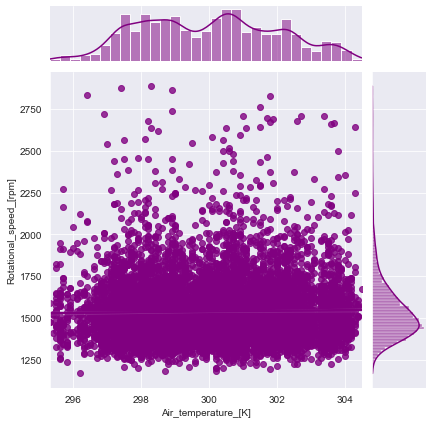

Correlacion entre Air_temperature_[K] y Torque_[Nm] ==>  -0.013777823050938618


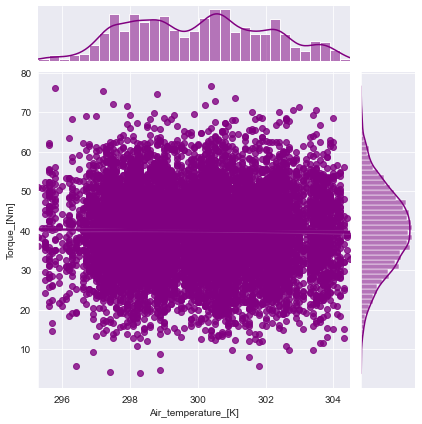

Correlacion entre Air_temperature_[K] y Tool_wear_[min] ==>  0.013852827663167115


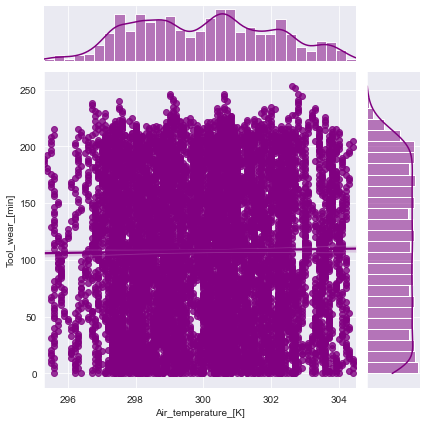

Correlacion entre Air_temperature_[K] y Target ==>  0.08255568978324358


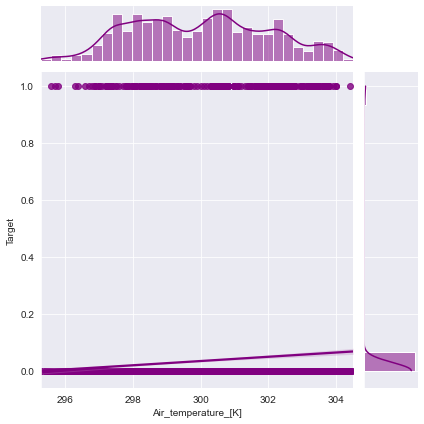

Correlacion entre Air_temperature_[K] y Power_[W] ==>  -0.011473944192324744


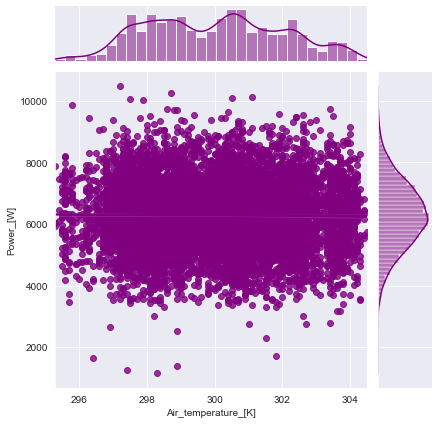

Correlacion entre Air_temperature_[K] y Overstrain_[minNm] ==>  0.006981071853538796


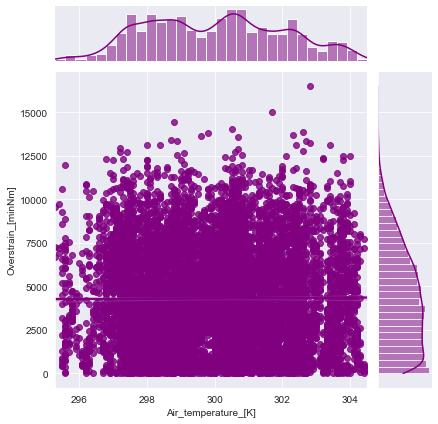

Correlacion entre Air_temperature_[K] y Heat dissipation_[rpminK] ==>  -0.44369675101664846


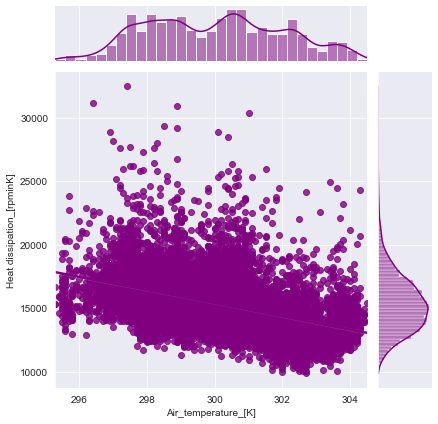

In [53]:
#JoinPlot
plt.figure(dpi = 100, figsize = (5,4))
print("Joint plot de Air_temperature_[K] con otras variables ==> \n")
for columna in  df.columns:
    if columna != "Air_temperature_[K]" and columna != "Type" and columna != "Failure_Type":
        print(f"Correlacion entre Air_temperature_[K] y {columna} ==> ",df.corr().loc["Air_temperature_[K]"][columna])
        sns.jointplot(x="Air_temperature_[K]",y=columna,data=df,kind = 'reg',color = 'purple')
        plt.show()

Marcada releacion lineal positiva entre la variable Air_temperature_[K] y la variable Process_temperature_[K]. 

# Graficos de Tres Ejes

Estos graficos ayudan a ver la distribucion de los eventos.

In [54]:

fig = px.scatter_3d(df, x='Tool_wear_[min]', y='Torque_[Nm]', z='Rotational_speed_[rpm]',
              color='Target')
fig.show()

In [65]:
fig = px.scatter_3d(df, x='Overstrain_[minNm]', y='Heat dissipation_[rpminK]', z='Power_[W]',
              color='Target')
fig.show()

In [55]:
fig = px.scatter_3d(fallas, x='Tool_wear_[min]', y='Torque_[Nm]', z='Rotational_speed_[rpm]',
              color='Target')
fig.show()

In [56]:
fig = px.scatter_3d(fallas, x='Tool_wear_[min]', y='Torque_[Nm]', z='Rotational_speed_[rpm]',
              color='Failure_Type')
fig.show()

In [57]:
fig = px.scatter_3d(fallas, x='Power_[W]', y='Torque_[Nm]', z='Process_temperature_[K]',
              color='Failure_Type')
fig.show()

In [62]:
fig = px.scatter_3d(fallas, x='Overstrain_[minNm]', y='Heat dissipation_[rpminK]', z='Power_[W]',
              color='Failure_Type')
fig.show()

In [58]:
df.groupby(['Target','Failure_Type']).median()

Air_temperature_[K]  Process_temperature_[K]  \
Target Failure_Type                                                             
0      No Failure                             300.00                    310.0   
       Random Failures                        300.75                    311.1   
1      Heat Dissipation Failure               302.45                    310.7   
       No Failure                             300.50                    309.9   
       Overstrain Failure                     299.45                    310.1   
       Power Failure                          300.40                    310.2   
       Tool Wear Failure                      300.40                    310.3   

                                 Rotational_speed_[rpm]  Torque_[Nm]  \
Target Failure_Type                                                    
0      No Failure                                1507.0        39.80   
       Random Failures                           1490.0        44.60   
1      Heat Dissipation Failure                  1346.0        52.35   
       No Failure                                1438.0        45.20   
       Overstrain Failure                        1362.5        56.75   
       Power Failure                             1386.0        63.60   
       Tool Wear Failure                         1521.0        37.70   

                                 Tool_wear_[min]    Power_[W]  \
Target Failure_Type                                             
0      No Failure                          107.0  6243.035753   
       Random Failures                     142.0  6915.074782   
1      Heat Dissipation Failure            106.0  7298.925044   
       No Failure                          119.0  6811.266088   
       Overstrain Failure                  207.0  8088.454402   
       Power Failure                       100.0  9100.377103   
       Tool Wear Failure                   215.0  5986.933120   

                                 Overstrain_[minNm]  Heat dissipation_[rpminK]  
Target Failure_Type                                                             
0      No Failure                           3951.20                   15196.80  
       Random Failures                      5645.40                   14837.85  
1      Heat Dissipation Failure             5549.65                   11050.85  
       No Failure                           4449.90                   15465.90  
       Overstrain Failure                  11545.40                   13862.65  
       Power Failure                        3608.80                   14188.20  
       Tool Wear Failure                    7843.20                   14706.00

     - Falla por desgaste de la herramienta (TWF): la herramienta se reemplazará por falla en un tiempo de desgaste de la herramienta seleccionado aleatoriamente entre 200 y 240 minutos (120 veces en nuestro conjunto de datos). En este momento, la herramienta se reemplaza 69 veces y falla 51 veces (asignadas aleatoriamente).
     - Falla por disipación de calor (HDF): la disipación de calor provoca una falla en el proceso, si la diferencia entre la temperatura del aire y la del proceso es inferior a 8,6 K y la velocidad de rotación de la herramienta es inferior a 1380 rpm. Este es el caso de 115 puntos de datos.
     - Falla de energía (PWF): el producto del par y la velocidad de rotación (en rad/s) es igual a la potencia requerida para el proceso. Si esta potencia está por debajo de 3500 W o por encima de 9000 W, el proceso falla, que es el caso 95 veces en nuestro conjunto de datos.
     - Fallo por sobreesfuerzo (OSF): si el producto del desgaste de la herramienta y el par supera los 11 000 minNm para la variante de producto L (12 000 M, 13 000 H), el proceso falla debido al sobreesfuerzo. Esto es cierto para 98 puntos de datos.
     